我们将随机从文件夹中抽一些图出来，显示出原图和模型按之前的公式算出的值，我们再给一参考值。

In [1]:
confThreshold = 0.5  #Confidence threshold
nmsThreshold = 0.4   #Non-maximum suppression threshold
inpWidth = 416       #Width of network's input image
inpHeight = 416      #Height of network's input image


In [2]:
import cv2 as cv
import os
import numpy as np


In [17]:
# Get the names of the output layers
def getOutputsNames(net):
    # Get the names of all the layers in the network
    layersNames = net.getLayerNames()
    # Get the names of the output layers, i.e. the layers with unconnected outputs
    return [layersNames[i[0] - 1] for i in net.getUnconnectedOutLayers()]

In [3]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt

%matplotlib inline

def rectangle(xy, width, height, edgecolor='r', linewidth=1, facecolor='none'):
    rect = patches.Rectangle(xy, width, height, linewidth=linewidth, 
                             edgecolor=edgecolor, facecolor=facecolor)
    plt.gca().add_patch(rect)

def show_detection(img, boxes, show=True, text_list = None,
                   fontsize = 12):
    plt.imshow(img)
    for i,box in enumerate(boxes):
        xmin,ymin,xmax,ymax = box
        #print((xmin,ymin), xmax-xmin, ymax-ymin)
        rectangle((xmin,ymin), xmax-xmin, ymax-ymin)
        if text_list is not None:
            plt.text(xmin, ymin-30, text_list[i], fontsize=fontsize, bbox=dict(facecolor='purple', alpha=0.1))
    if show:
        plt.show()
        
def show_detection2(img, boxes_ltwh, **kwargs):
    boxes_ltrb = []
    for left,top,width,height in boxes_ltwh:
        boxes_ltrb.append([ left, top, left + width, top + height])
    show_detection(img, boxes_ltrb, **kwargs)

In [4]:
# Load names of classes
classesFile = "voc.names";
classes = None
with open(classesFile, 'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

# Give the configuration and weight files for the model and load the network using them.
#modelConfiguration = os.path.abspath("yolov3-tiny-tank.cfg")
#modelWeights = os.path.abspath("backup_YOLO/yolov3-tiny-tank_19000.weights")
modelConfiguration = "yolov3-tiny-tank.cfg"
modelWeights = "backup_YOLO/yolov3-tiny-tank_19000.weights"

net = cv.dnn.readNetFromDarknet(modelConfiguration, modelWeights)
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)


In [5]:
def detect(frame):
    
    # Create a 4D blob from a frame.
    blob = cv.dnn.blobFromImage(frame, 1/255, (inpWidth, inpHeight), [0,0,0], 1, crop=False)

    # Sets the input to the network
    net.setInput(blob)

    # Runs the forward pass to get output of the output layers
    outs = net.forward(getOutputsNames(net))
    
    frameHeight = frame.shape[0]
    frameWidth = frame.shape[1]

    classIds = []
    confidences = []
    boxes = []
    # Scan through all the bounding boxes output from the network and keep only the
    # ones with high confidence scores. Assign the box's class label as the class with the highest score.
    classIds = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            classId = np.argmax(scores)
            confidence = scores[classId]
            if confidence > confThreshold:
                center_x = int(detection[0] * frameWidth)
                center_y = int(detection[1] * frameHeight)
                width = int(detection[2] * frameWidth)
                height = int(detection[3] * frameHeight)
                left = int(center_x - width / 2)
                top = int(center_y - height / 2)
                classIds.append(classId)
                confidences.append(float(confidence))
                boxes.append([left, top, width, height])
                
    return classIds,confidences,boxes

In [12]:
def preprocess(name = None, path=None):
    #name = '20180421153245.jpg' # multiple box
    if path is None:
        img_path = os.path.join('data', name)
    else:
        img_path = path
    frame_bgr = cv.imread(img_path)
    frame = cv.cvtColor(frame_bgr, cv.COLOR_BGR2RGB)

    classIds,confidences,boxes = detect(frame)
    return frame,classIds,confidences,boxes

In [7]:
def extract_max(classIds, confidences):
    max_bar_idx = None # 还是学C++的写法吧。。反正等下还要翻译成C++，这个写法本身的numpy写法也不算直观
    max_piece_idx = None
    max_bar_conf = 0
    max_piece_conf = 0
    for i in range(len(classIds)):
        if classIds[i] == 1:
            if confidences[i] > max_bar_conf:
                max_bar_conf = confidences[i]
                max_bar_idx = i
        elif classIds[i] == 2:
            if confidences[i] > max_piece_conf:
                max_piece_conf = confidences[i]
                max_piece_idx = i
    return max_bar_idx, max_piece_idx


In [14]:
import glob
import random

In [15]:
paths = random.choices(glob.glob('data/*.jpg'), k = 50)

In [26]:
frame.shape

(1080, 1920, 3)

In [31]:
def mismatch_adjust(box):
    left,top,width,height = box
    ratio = height / width # 4.0 is "anchor" value, it seems that model tend to give wrong value for top, so we only adjust top part
    value = (4 - ratio) * width
    top -= value
    height += value
    return left,top,width,height

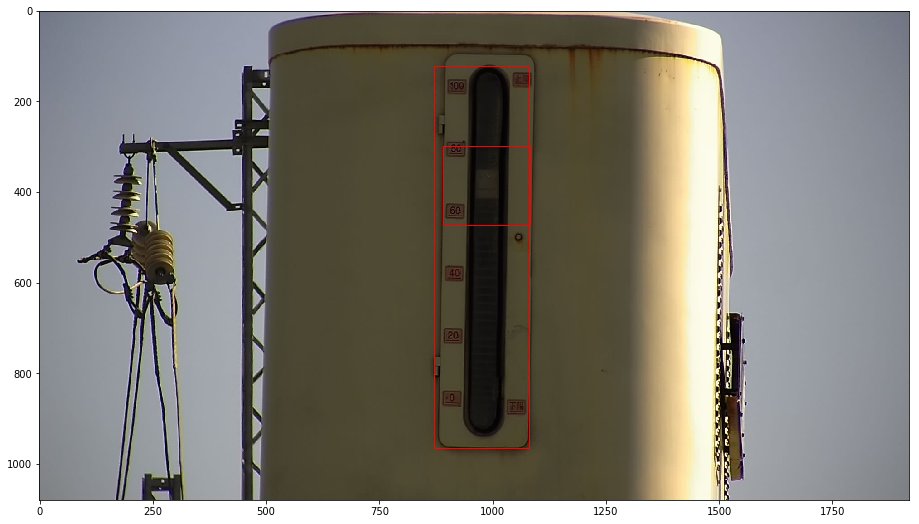

ratio: 4.0
top distance: 122.00000000000003 bottom distance: 114.0
data/20180915103340.jpg 68.72037914691943->


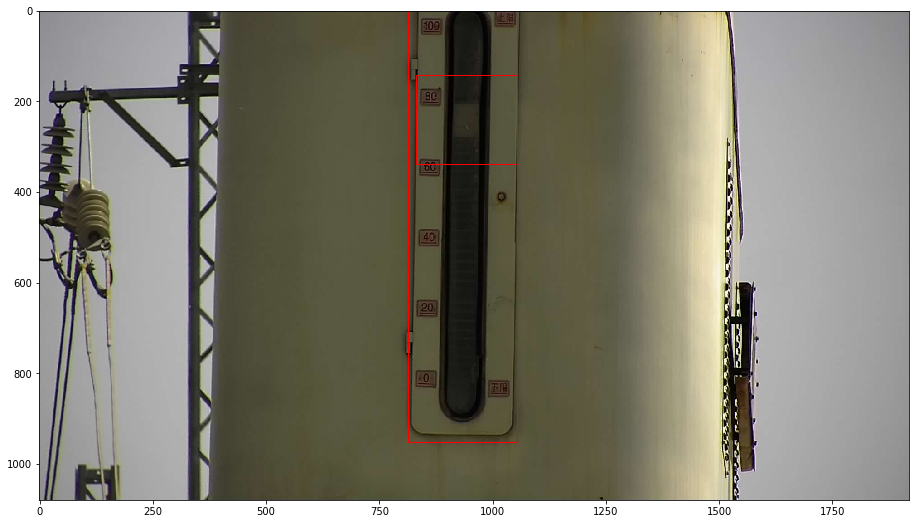

ratio: 4.0
top distance: -17.00000000000002 bottom distance: 129.0
data/20180603120404.jpg 73.50206611570248->


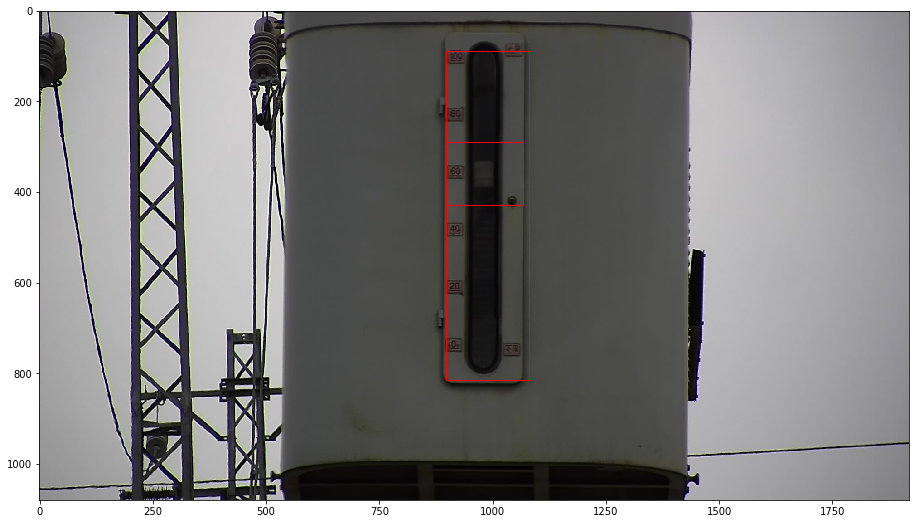

ratio: 4.0
top distance: 87.99999999999996 bottom distance: 264.0
data/20180819110347.jpg 62.77472527472527->60


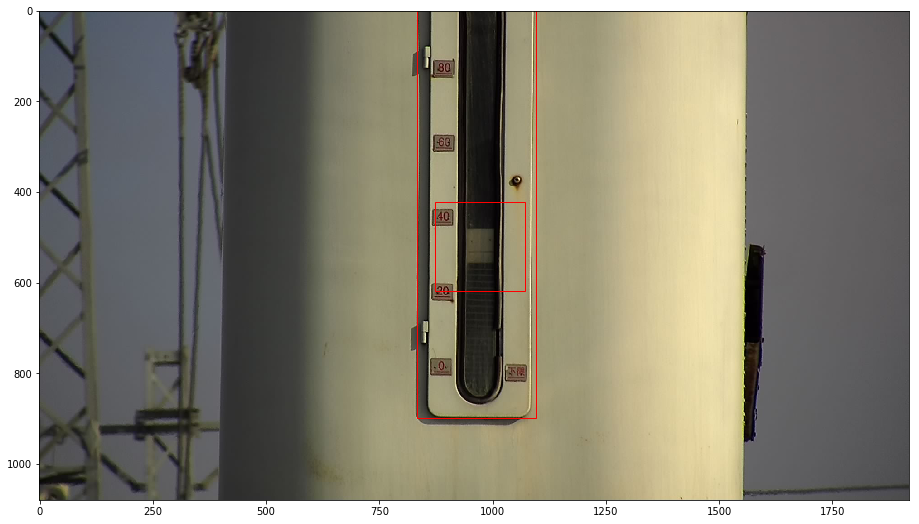

ratio: 4.0
top distance: -154.00000000000006 bottom distance: 182.0
data/20181113125957.jpg 35.88403041825095->


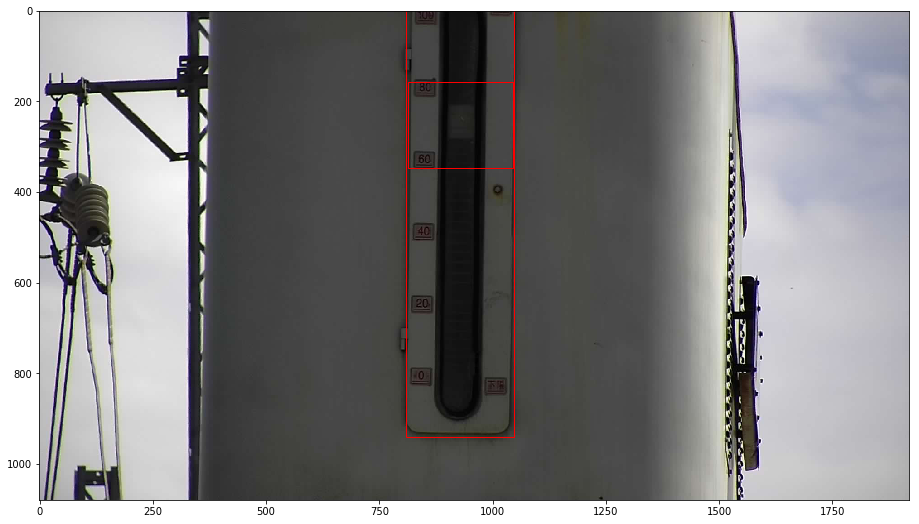

ratio: 4.000000000000001
top distance: -19.0000000000001 bottom distance: 139.0
data/20180626112603.jpg 71.71874999999999->


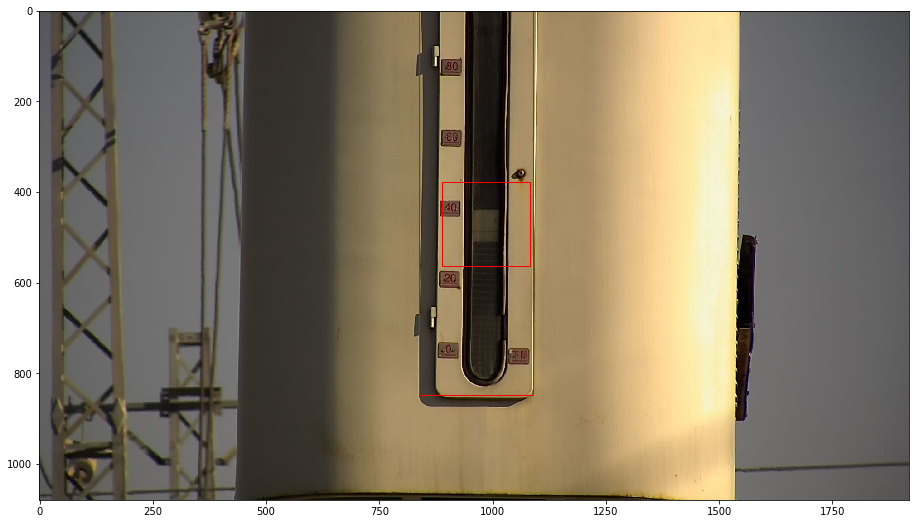

ratio: 4.0
top distance: -155.00000000000003 bottom distance: 231.0
data/20181117123001.jpg 37.699203187250994->


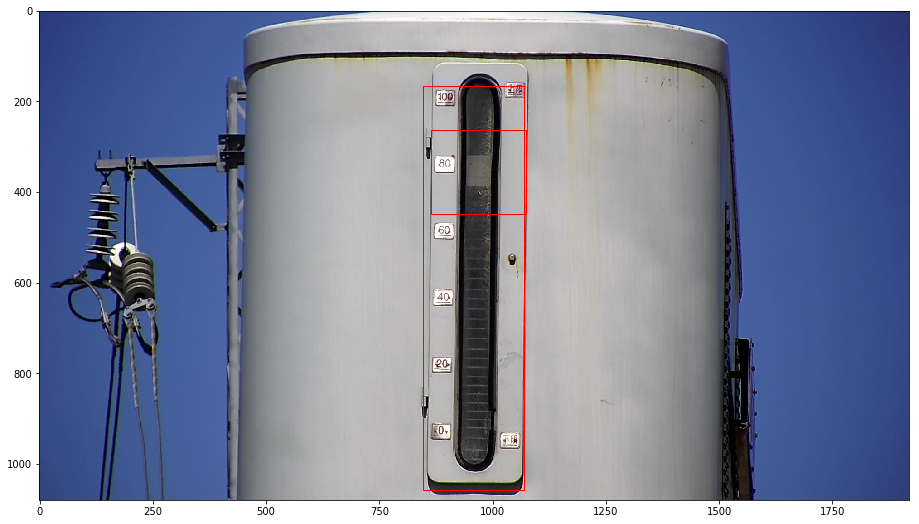

ratio: 4.000000000000001
top distance: 165.99999999999991 bottom distance: 22.0
data/20180710154136.jpg 78.7556053811659->


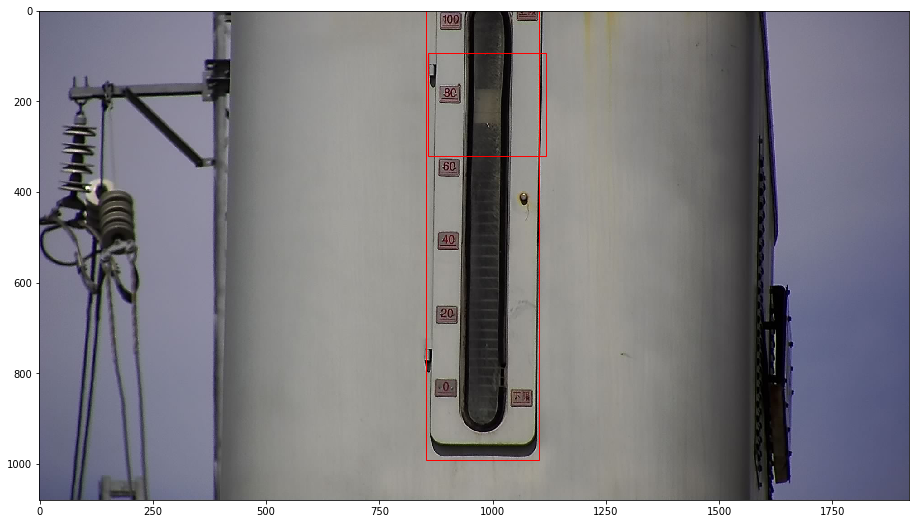

ratio: 4.0
top distance: -4.999999999999986 bottom distance: 89.0
data/20180702160304.jpg 78.714859437751->


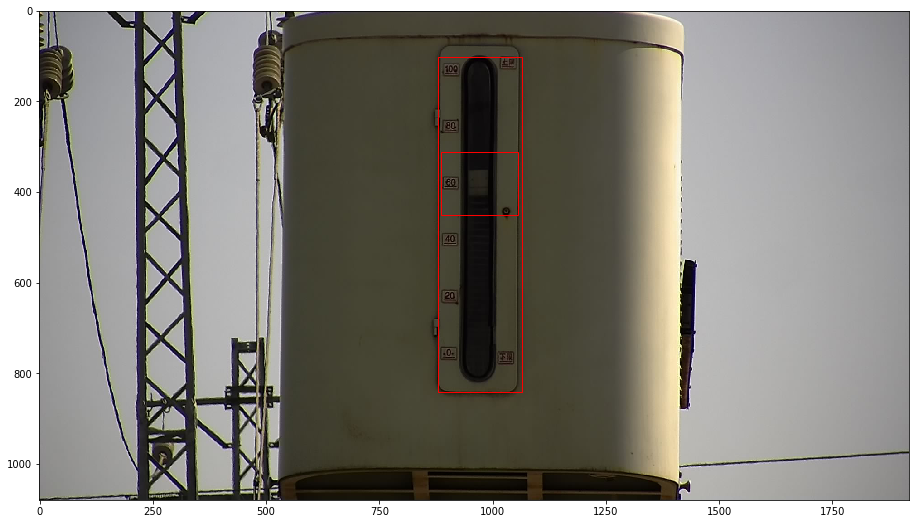

ratio: 4.0
top distance: 102.00000000000003 bottom distance: 238.0
data/20180818105555.jpg 62.29729729729729->


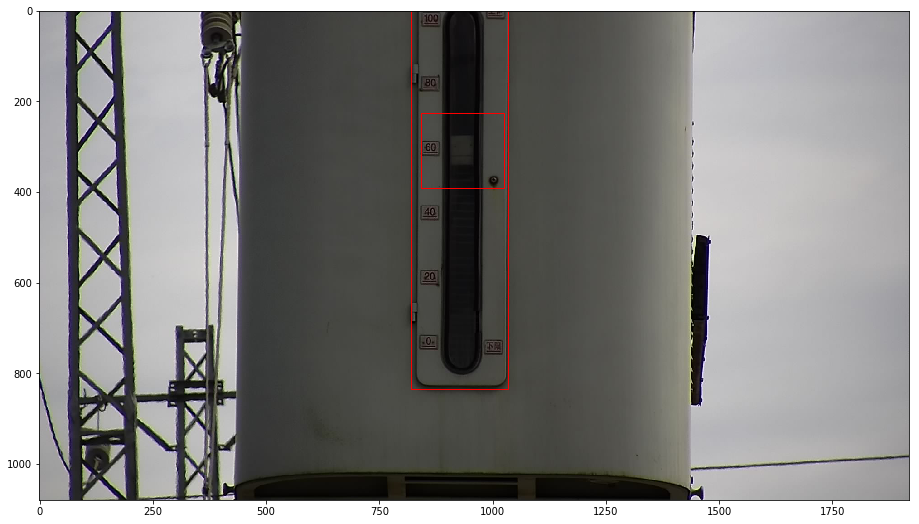

ratio: 4.0
top distance: -25.000000000000032 bottom distance: 245.0
data/20180730110742.jpg 61.22093023255813->


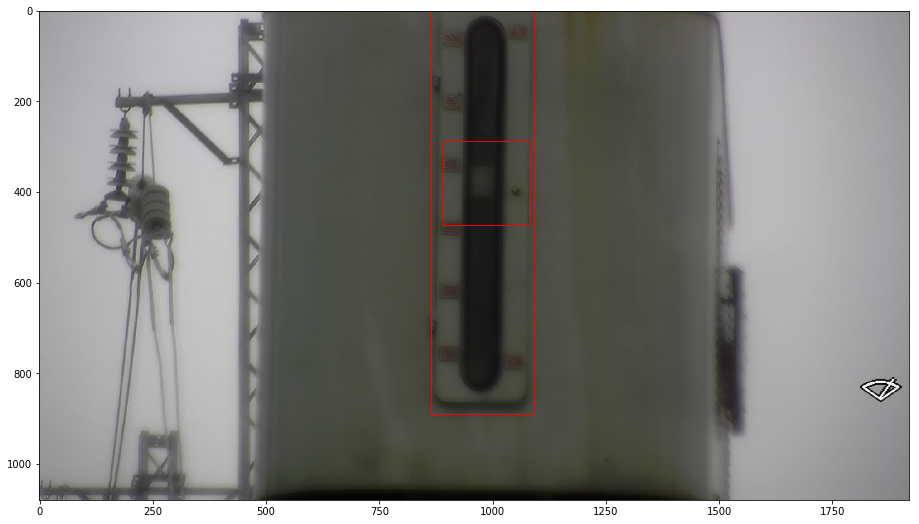

ratio: 4.0
top distance: -13.999999999999972 bottom distance: 190.0
data/20181101153438.jpg 56.47123893805309->


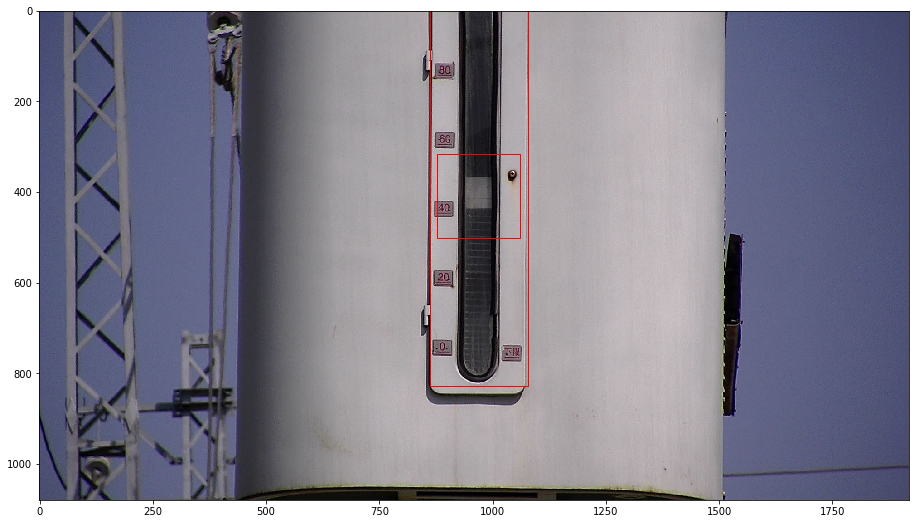

ratio: 4.0
top distance: -36.0 bottom distance: 252.0
data/20180412144041.jpg 48.495370370370374->


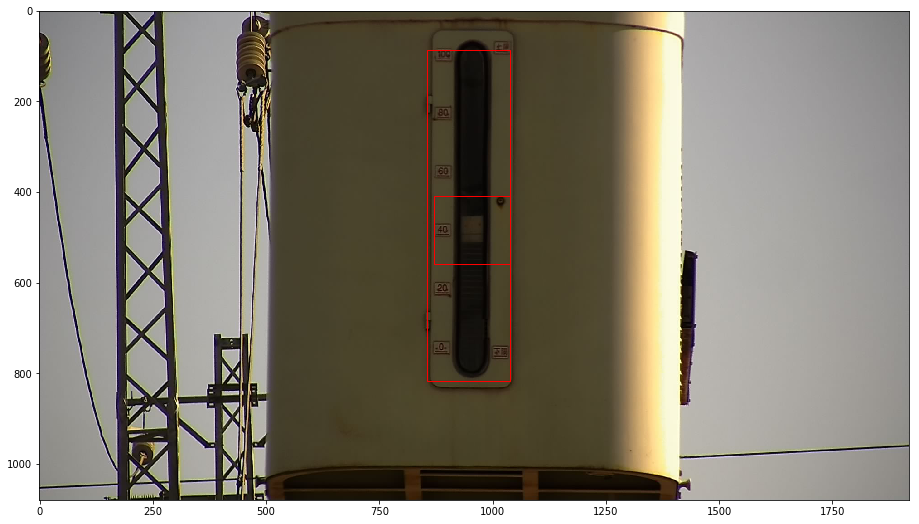

ratio: 4.0
top distance: 85.99999999999999 bottom distance: 262.0
data/20180915101802.jpg 45.560109289617486->41


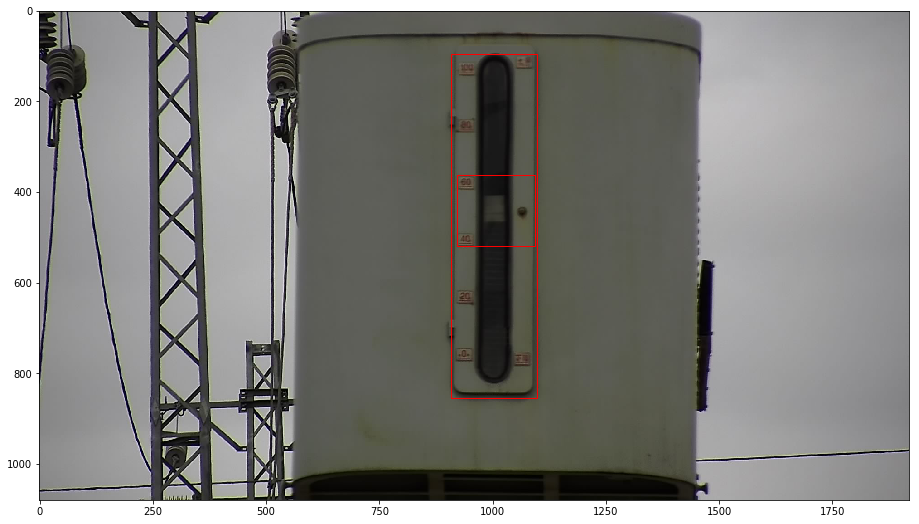

ratio: 4.0
top distance: 95.00000000000003 bottom distance: 225.0
data/20180514110727.jpg 54.53947368421053->50


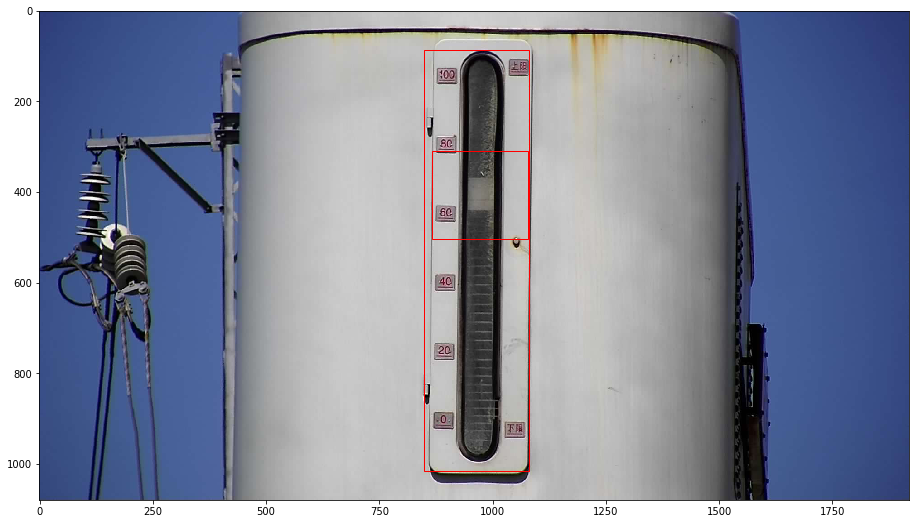

ratio: 4.0
top distance: 87.00000000000003 bottom distance: 65.0
data/20180516160504.jpg 65.51724137931035->


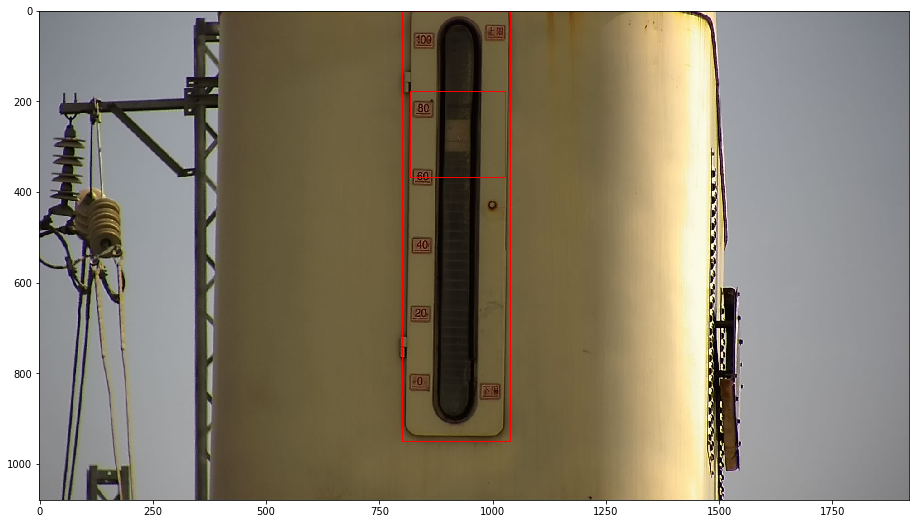

ratio: 4.0
top distance: 1.0 bottom distance: 131.0
data/20180731120411.jpg 71.36075949367088->


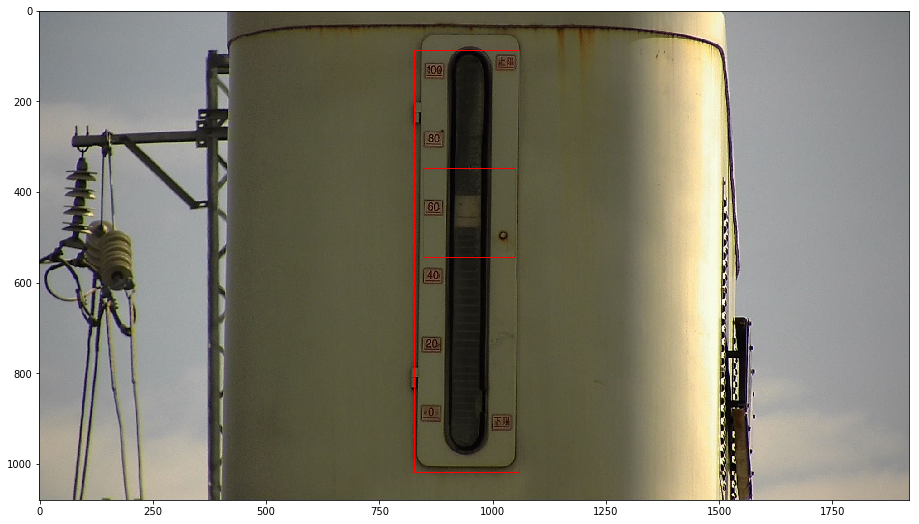

ratio: 4.0
top distance: 87.00000000000001 bottom distance: 61.0
data/20180410110504.jpg 61.641630901287556->


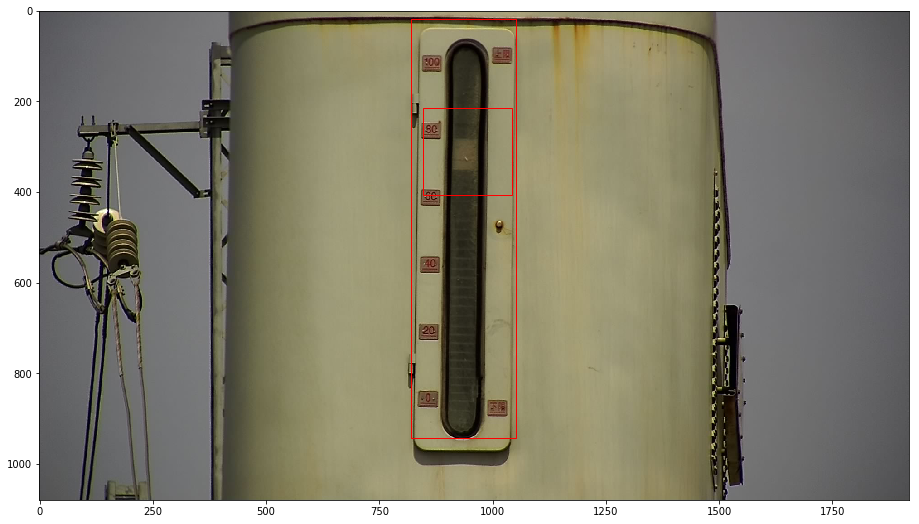

ratio: 4.0
top distance: 19.00000000000002 bottom distance: 137.0
data/20180617150619.jpg 68.45238095238095->71


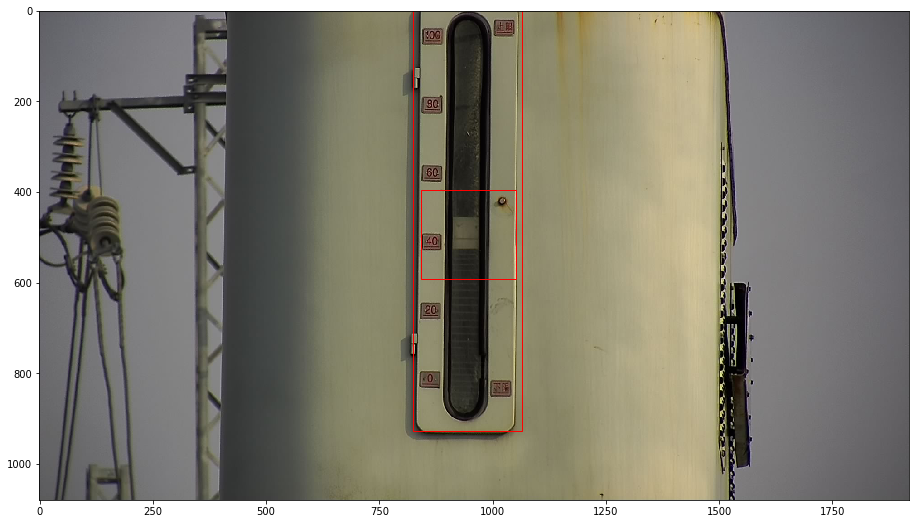

ratio: 4.0
top distance: -41.0 bottom distance: 153.0
data/20181115130523.jpg 44.679752066115704->43


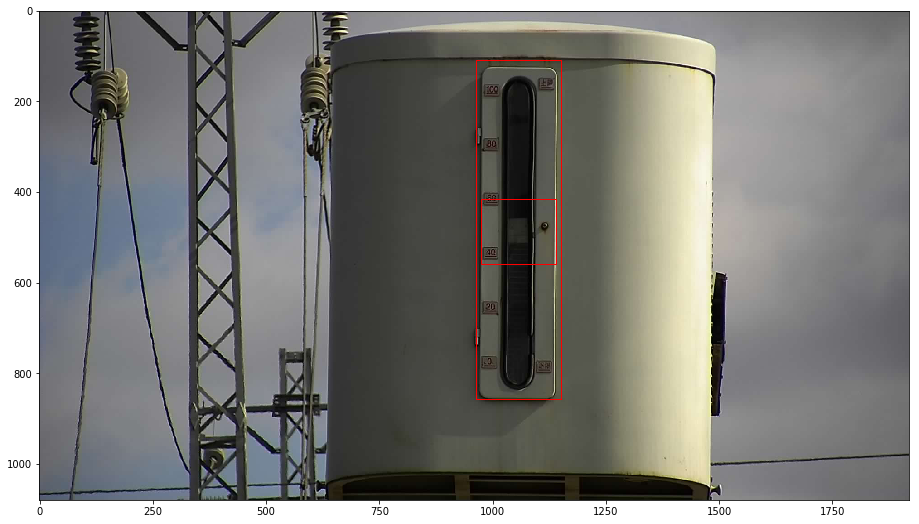

ratio: 4.0
top distance: 108.00000000000001 bottom distance: 224.0
data/20180926120045.jpg 49.331550802139034->


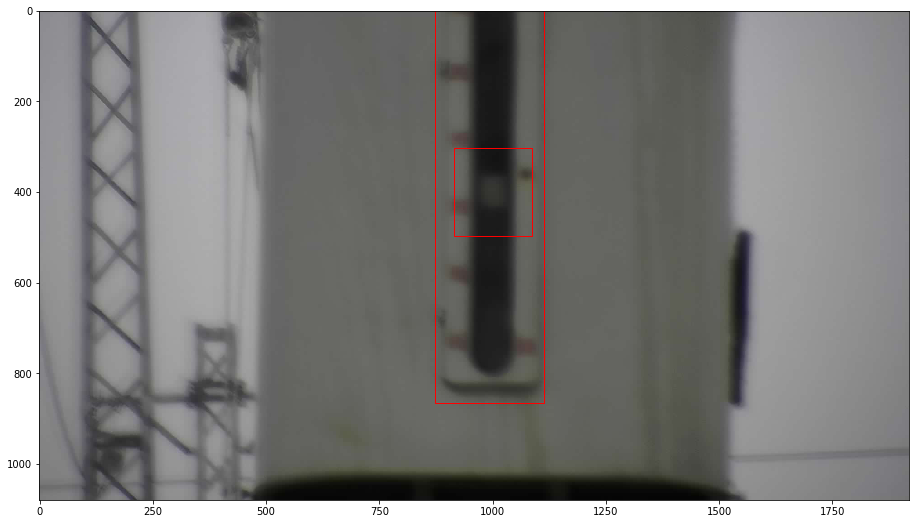

ratio: 4.0
top distance: -94.00000000000003 bottom distance: 214.0
data/20181029092934.jpg 48.489583333333336->43


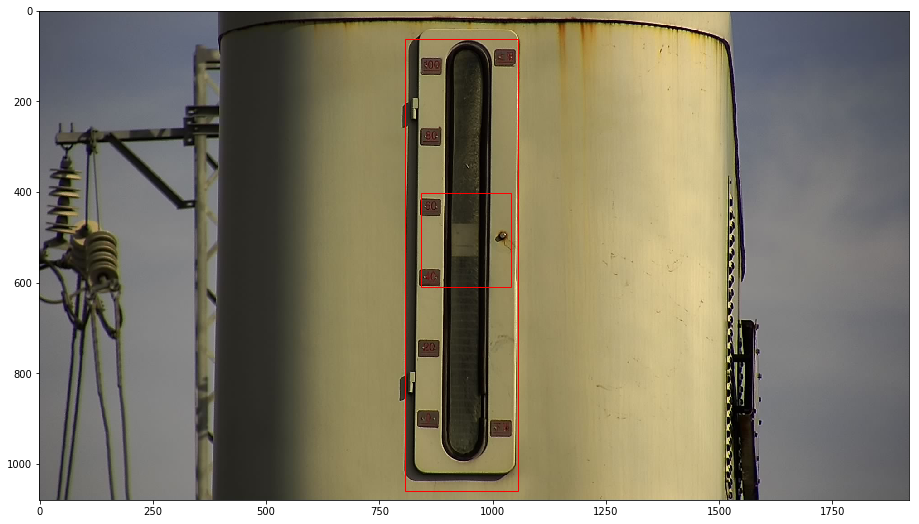

ratio: 4.0
top distance: 63.00000000000003 bottom distance: 21.0
data/20181102132155.jpg 55.57228915662651->50


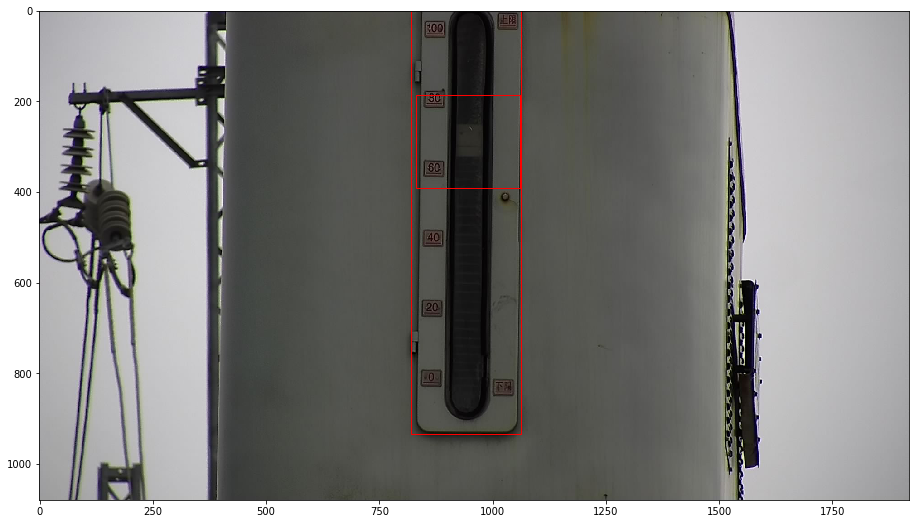

ratio: 4.0
top distance: -36.99999999999999 bottom distance: 145.0
data/20180726111046.jpg 66.46090534979425->


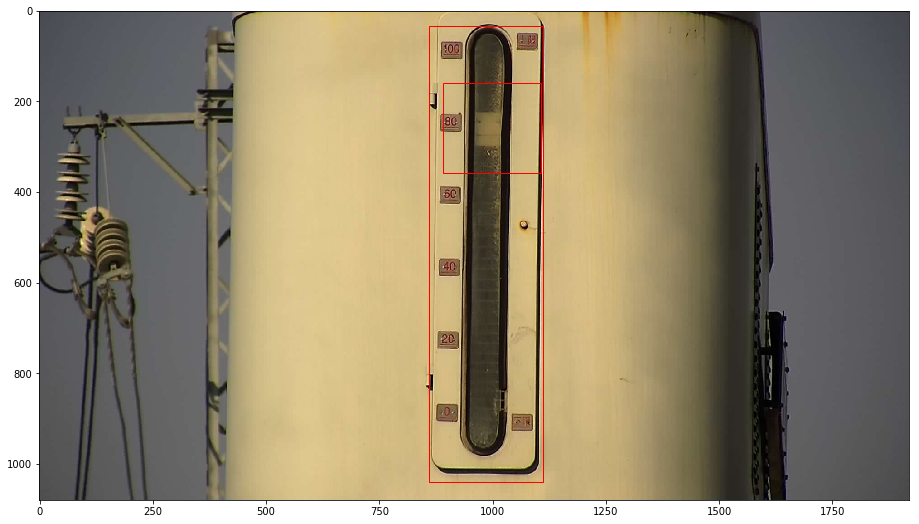

ratio: 4.0
top distance: 33.00000000000003 bottom distance: 39.0
data/20180821175837.jpg 77.62896825396825->


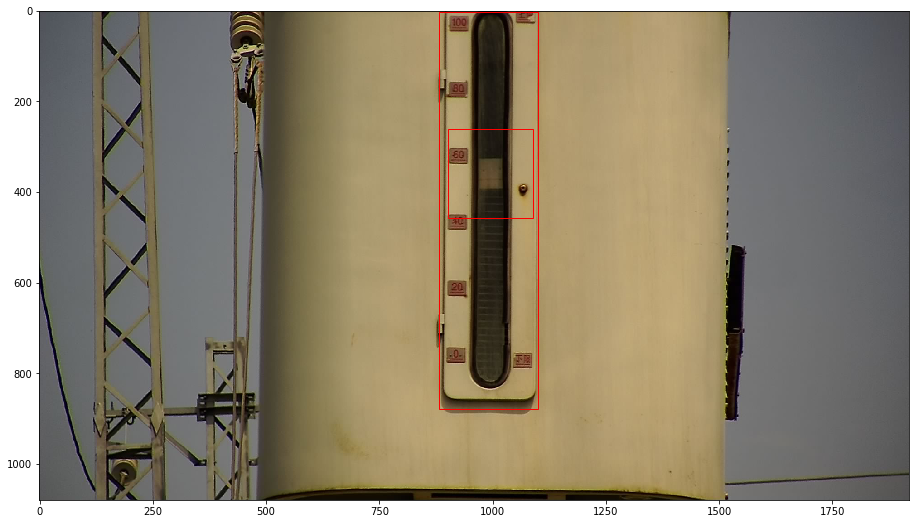

ratio: 4.0
top distance: 3.0000000000000124 bottom distance: 201.0
data/20180518144106.jpg 59.30365296803652->55


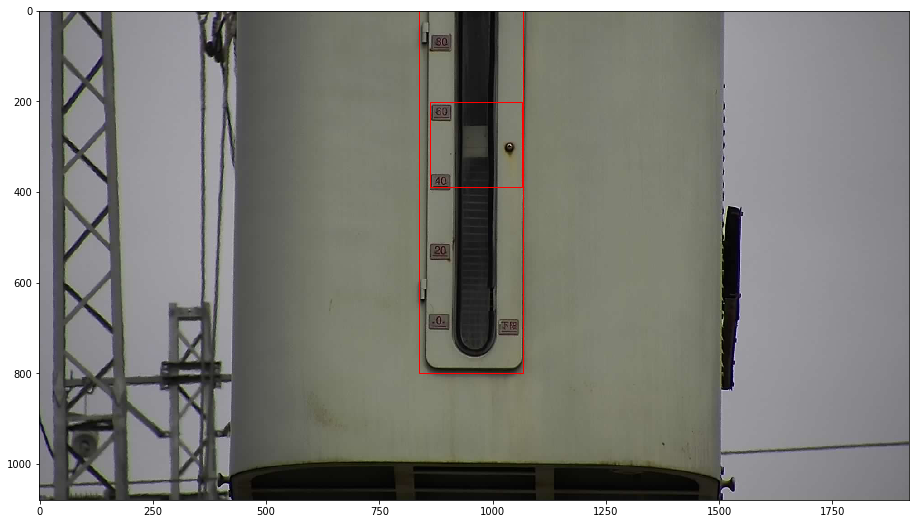

ratio: 4.0
top distance: -117.00000000000001 bottom distance: 281.0
data/20180912153329.jpg 54.91266375545851->51


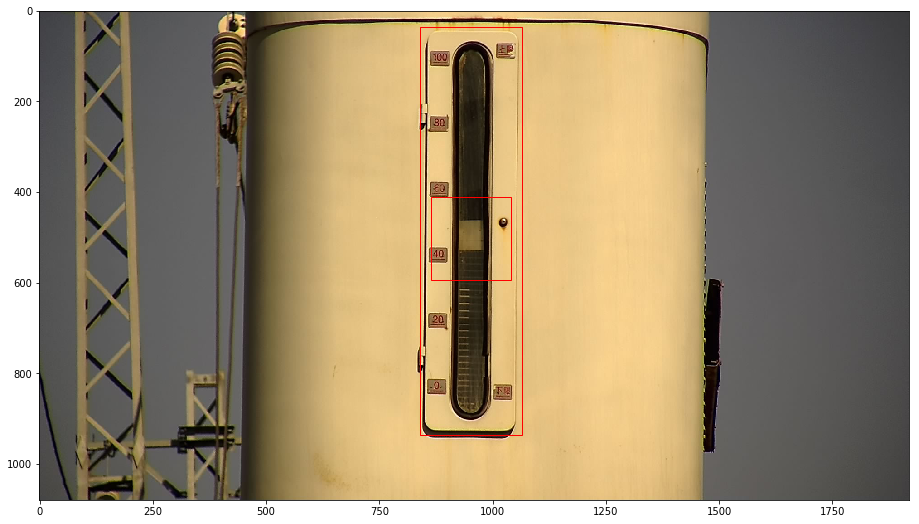

ratio: 4.0
top distance: 35.999999999999986 bottom distance: 144.0
data/20180916150312.jpg 48.16666666666667->45


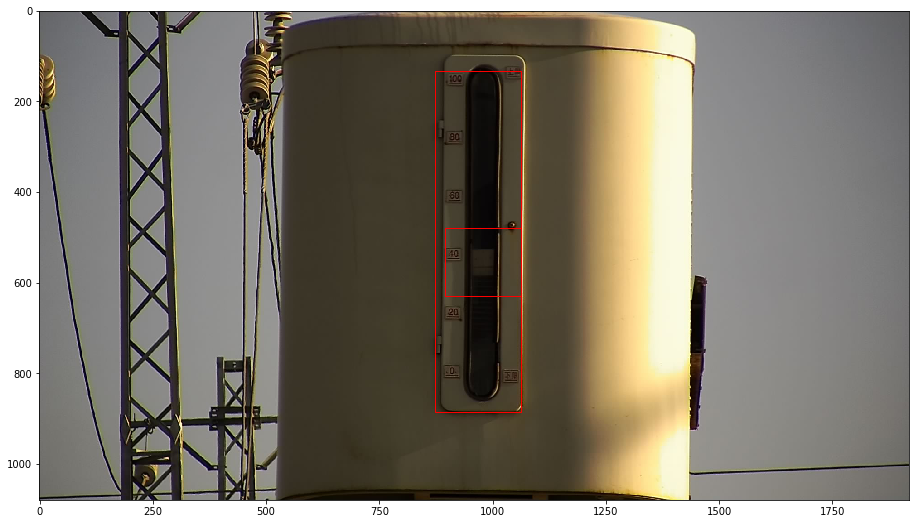

ratio: 4.0
top distance: 133.99999999999997 bottom distance: 194.0
data/20181103111450.jpg 44.148936170212764->38


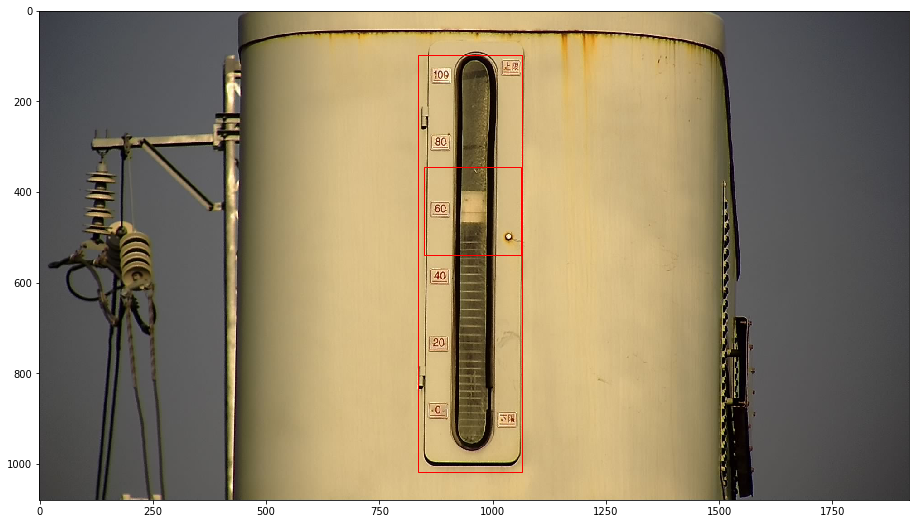

ratio: 3.9999999999999996
top distance: 98.00000000000009 bottom distance: 62.0
data/20181028161943.jpg 62.66304347826088->


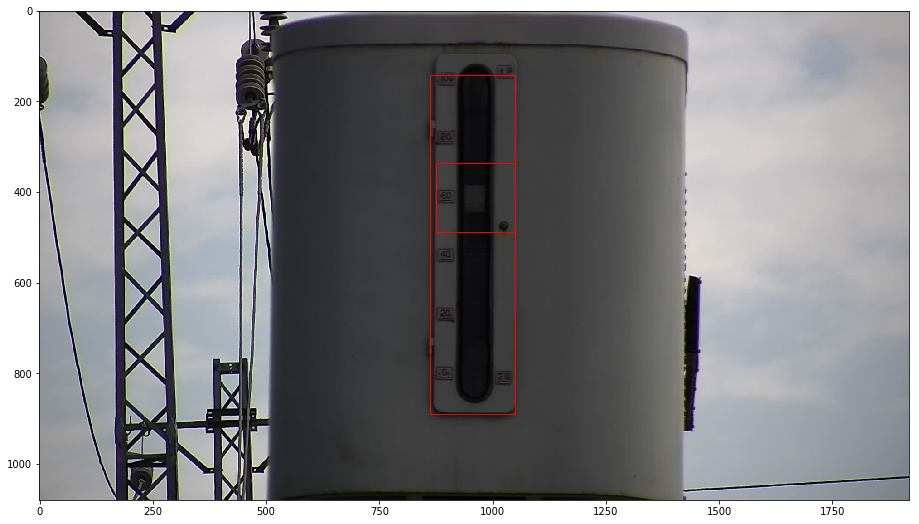

ratio: 4.0
top distance: 142.0 bottom distance: 190.0
data/20180803105832.jpg 63.970588235294116->


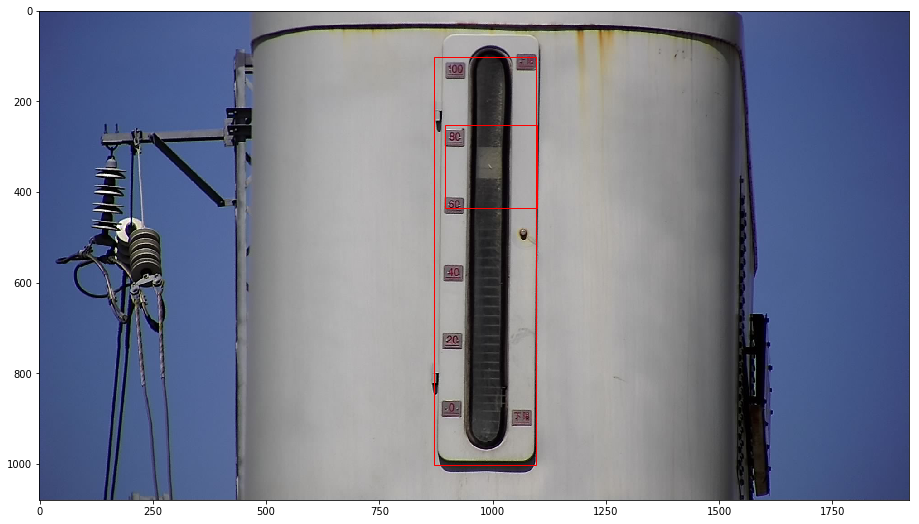

ratio: 4.0
top distance: 103.00000000000003 bottom distance: 77.0
data/20180619155704.jpg 73.22222222222223->


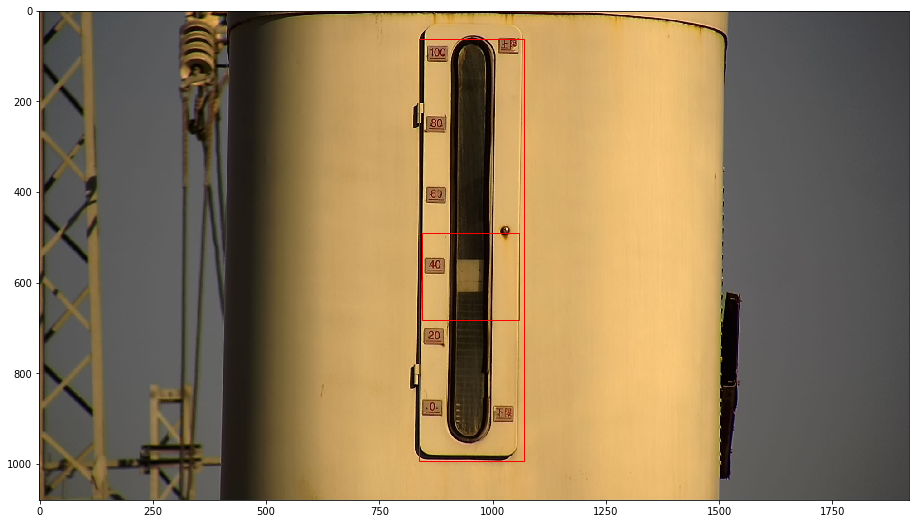

ratio: 4.0
top distance: 62.00000000000003 bottom distance: 86.0
data/20181120143752.jpg 43.723175965665234->38


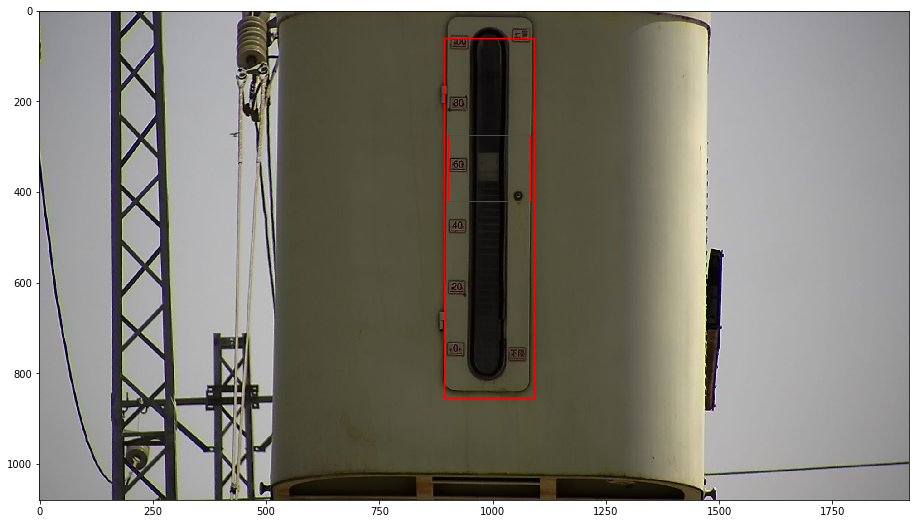

ratio: 4.0
top distance: 59.000000000000036 bottom distance: 225.0
data/20180603115052.jpg 63.881909547738694->


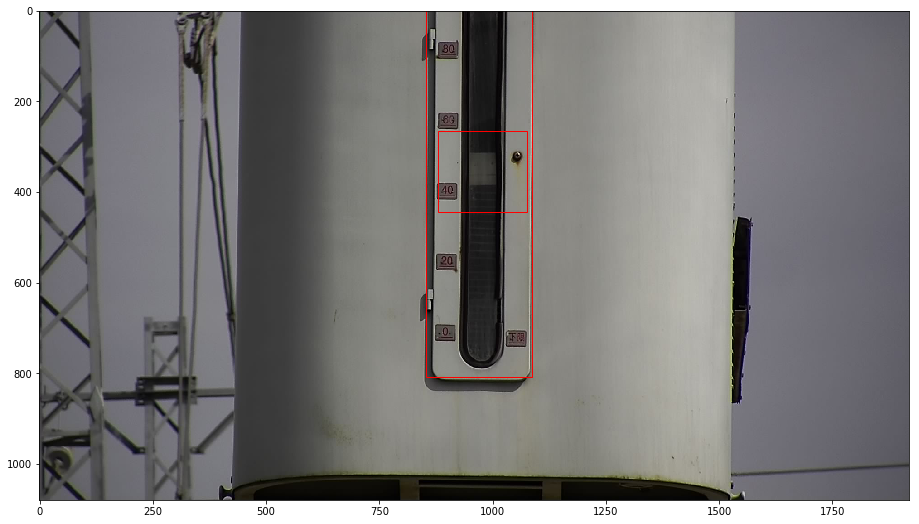

ratio: 4.0
top distance: -136.00000000000003 bottom distance: 272.0
data/20180923133808.jpg 47.934322033898304->


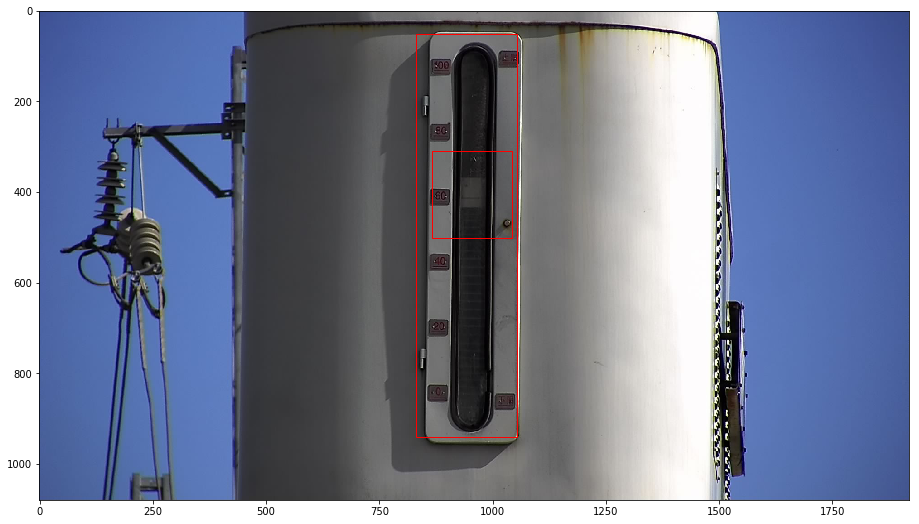

ratio: 4.0
top distance: 51.99999999999997 bottom distance: 140.0
data/20180926121736.jpg 60.19144144144144->


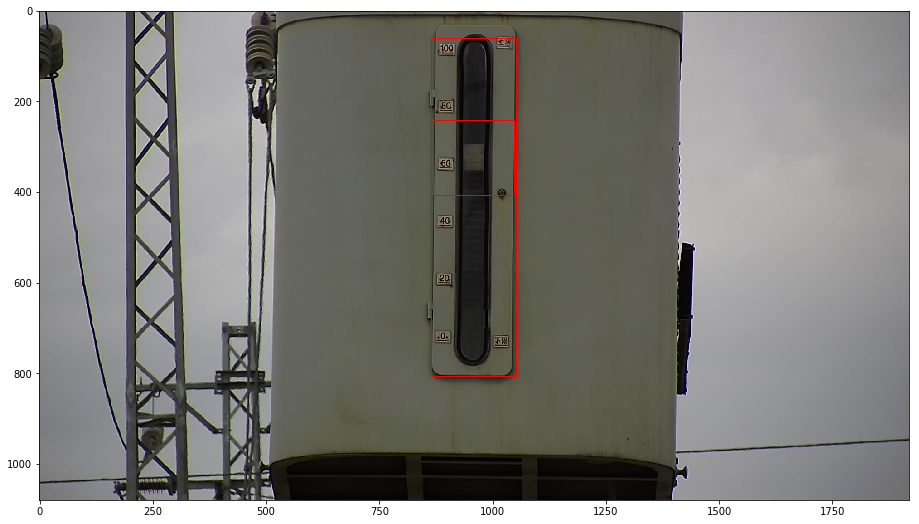

ratio: 4.0
top distance: 58.999999999999986 bottom distance: 273.0
data/20180611181944.jpg 64.57219251336899->


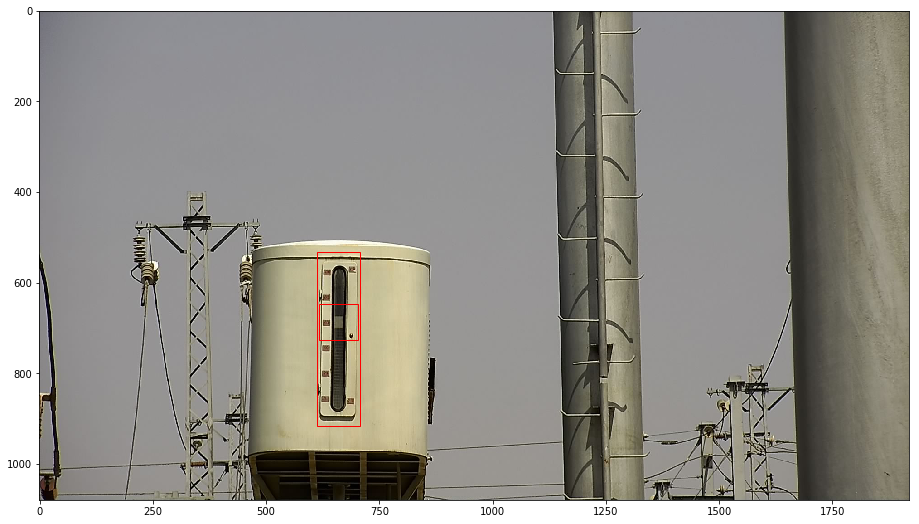

ratio: 4.0
top distance: 532.0 bottom distance: 164.0
data/20180512145500_12_21.jpg 59.635416666666664->


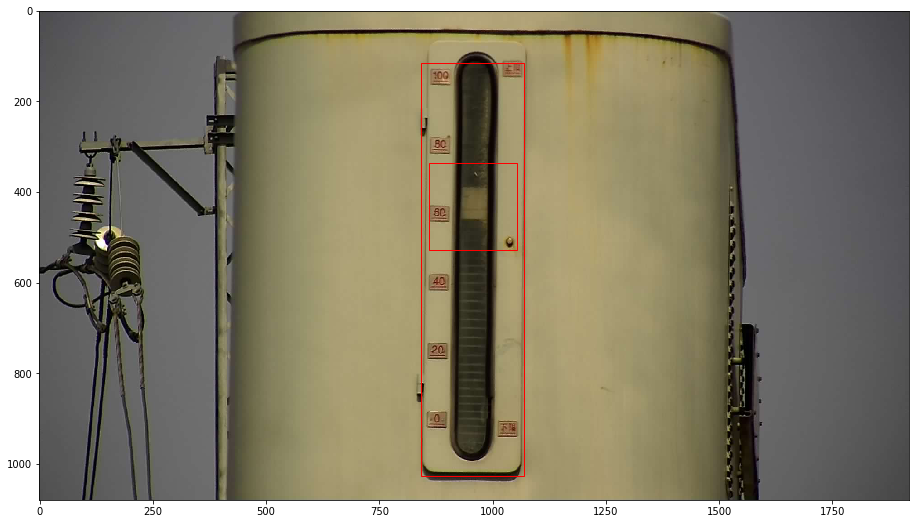

ratio: 4.0
top distance: 115.0 bottom distance: 53.0
data/20180421154654.jpg 65.24122807017544->


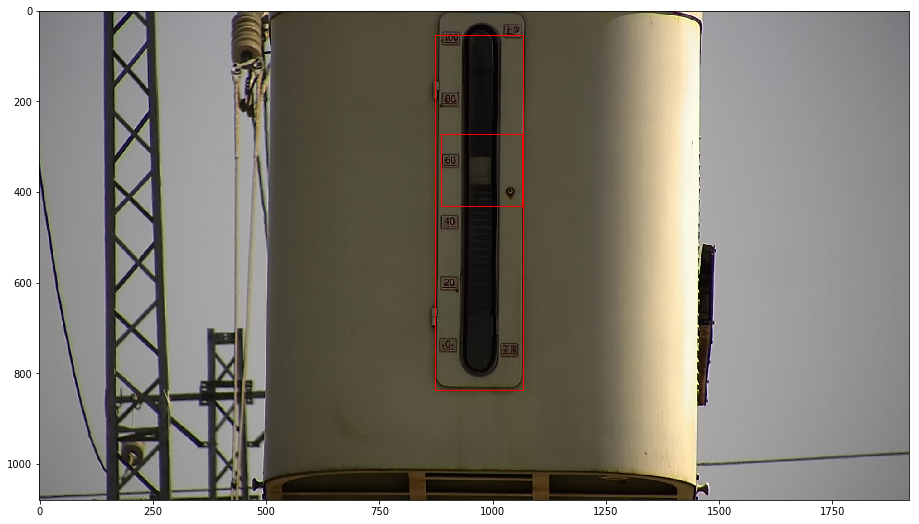

ratio: 3.9999999999999996
top distance: 53.000000000000085 bottom distance: 243.0
data/20180815115435.jpg 61.862244897959194->59


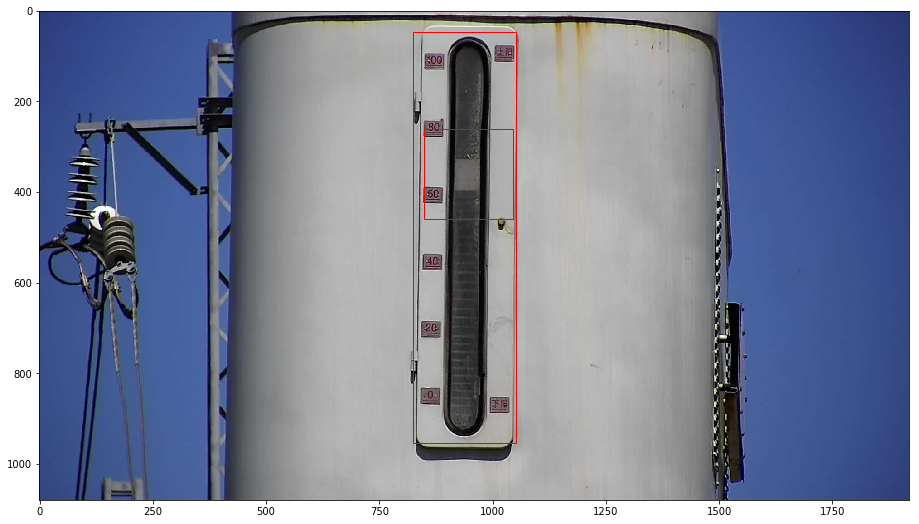

ratio: 4.0
top distance: 46.0 bottom distance: 126.0
data/20180521150847.jpg 65.36343612334802->


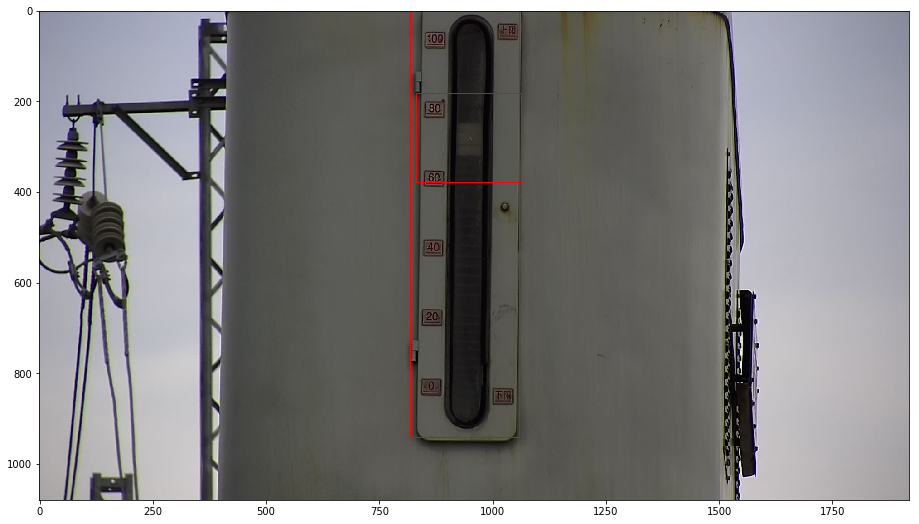

ratio: 4.0
top distance: -23.000000000000043 bottom distance: 139.0
data/20180609110339.jpg 68.56846473029046->


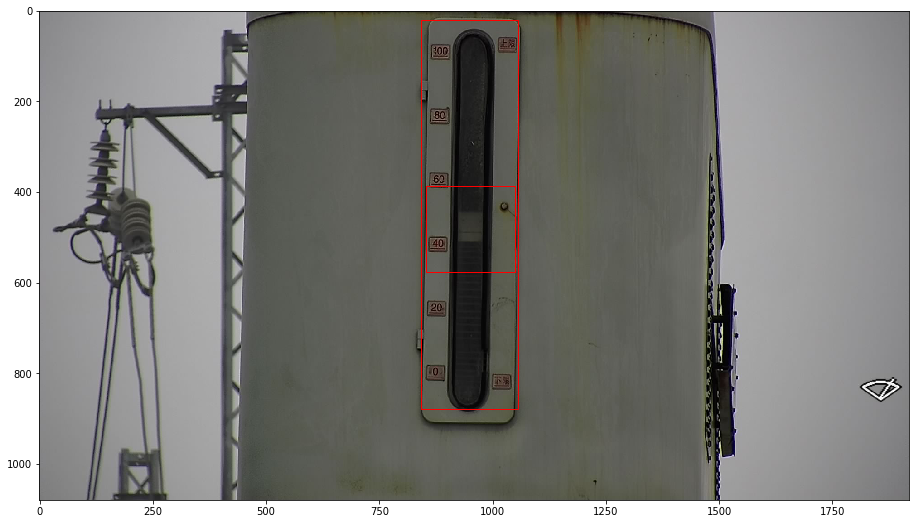

ratio: 4.0
top distance: 20.000000000000043 bottom distance: 200.0
data/20181122122559.jpg 46.33720930232558->


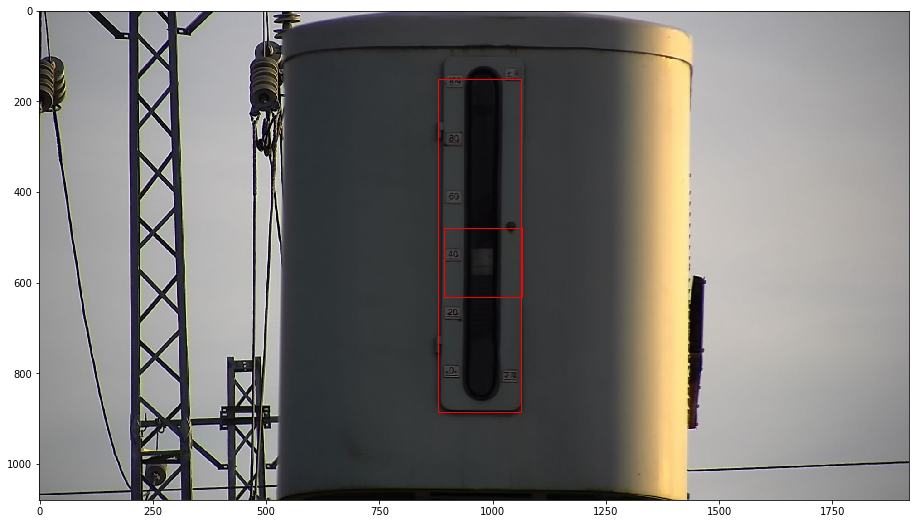

ratio: 4.0
top distance: 150.0 bottom distance: 194.0
data/20181104093204.jpg 44.97282608695652->38


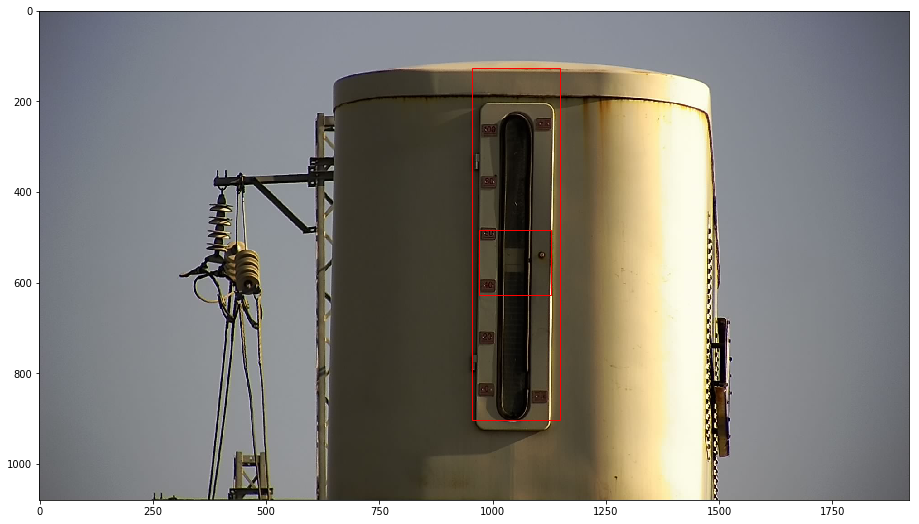

ratio: 4.0
top distance: 126.99999999999996 bottom distance: 177.0
data/20181103113019.jpg 44.71649484536083->45


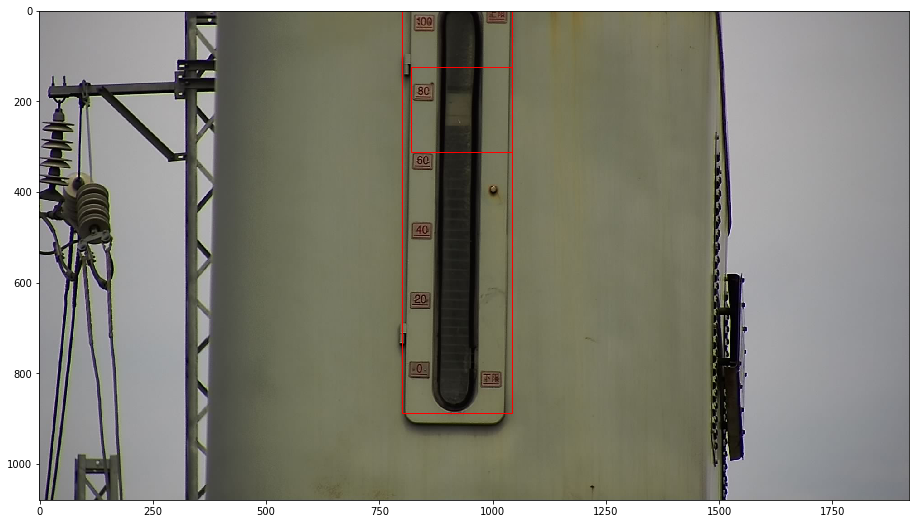

ratio: 4.0
top distance: -77.00000000000006 bottom distance: 193.0
data/20180730151643.jpg 69.39834024896265->75


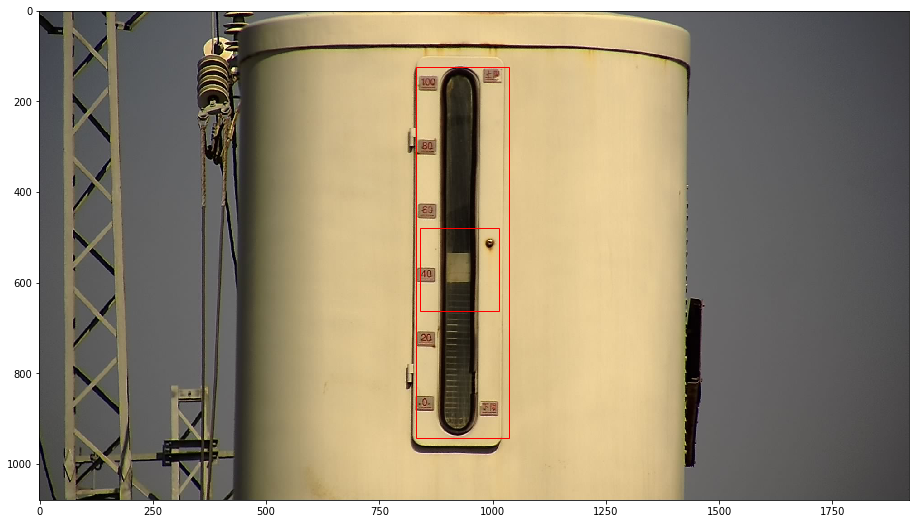

ratio: 4.0
top distance: 123.00000000000003 bottom distance: 137.0
data/20180914150529.jpg 45.426829268292686->


TypeError: list indices must be integers or slices, not NoneType

<Figure size 1152x648 with 0 Axes>

In [33]:
for path in paths:
    frame,classIds,confidences,boxes = preprocess(path=path)
    max_bar_idx, max_piece_idx = extract_max(classIds, confidences)
    
    plt.figure(figsize=(16,9))
    #show_detection2(frame, [boxes[max_bar_idx], boxes[max_piece_idx]])
    show_detection2(frame, [mismatch_adjust(boxes[max_bar_idx]), boxes[max_piece_idx]])
    
    img_height,img_width,_ = frame.shape
    
    bar_left,bar_top,bar_width,bar_height = mismatch_adjust(boxes[max_bar_idx])
    piece_left,piece_top,piece_width,piece_height = boxes[max_piece_idx]
    bar_right = bar_left+bar_width
    bar_bottom = bar_top + bar_height
    piece_right = piece_left + piece_width
    piece_bottom = piece_top + piece_height
    
    unadjusted = -((piece_top + piece_bottom)/2 - bar_bottom) / bar_height * 100
    print('ratio: {}'.format(bar_height / bar_width))
    print('top distance: {} bottom distance: {}'.format(bar_top, img_height - bar_bottom))
    adjusted = input('{} {}->'.format(path, unadjusted))
    if adjusted == 'q':
        break
    elif adjusted == '':
        adjusted = unadjusted
    elif adjusted == 's':
        continue
    
    with open('adjust_data','a') as f:
        f.write('{} {} {}\n'.format(path, unadjusted, adjusted))

In [34]:
max_bar_idx

1

In [35]:
max_piece_idx

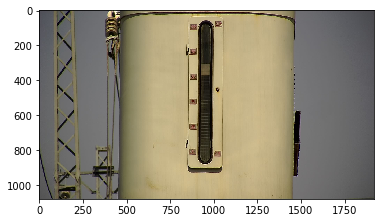

In [37]:
plt.imshow(frame)

In [38]:
paths.index(path)

46

In [39]:
with open('adjust_data') as f:
    lines = f.read().split('\n')

In [42]:
ori_list = []
adj_list = []
for line in lines:
    p, ori, adj = line.strip().split(' ')
    ori_list.append(float(ori))
    adj_list.append(float(adj))

ValueError: too many values to unpack (expected 3)

In [46]:
ll = line.replace('data/', ' ').strip().split(' ')

In [47]:
ori_list = []
adj_list = []
for i in range(len(ll)):
    if i%3 ==1:
        ori_list.append(float(ll[i]))
    elif i %3==2:
        adj_list.append(float(ll[i]))

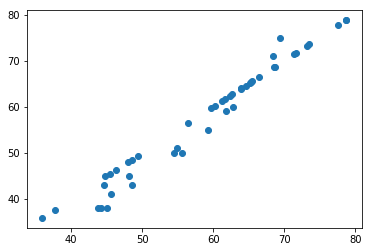

In [49]:
plt.plot(ori_list, adj_list,'o')

In [50]:
ori_list = []
adj_list = []
for i in range(0,len(ll),3):
    if ll[i+1] != ll[i+2]:
        ori_list.append(float(ll[i+1]))
        adj_list.append(float(ll[i+2]))

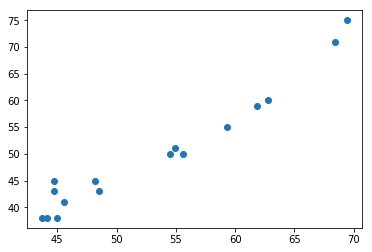

In [51]:
plt.plot(ori_list, adj_list,'o')

In [58]:
from  scipy.optimize  import minimize

In [62]:
ori_arr = np.array(ori_list)
adj_arr = np.array(adj_list)
def loss(p):
    a,b = p
    return np.sum((a+b*ori_arr-adj_arr)**2)

In [64]:
minimize(loss, np.array([0.,0.]))

      fun: 104.24125923134315
 hess_inv: array([[ 1.19611971e+00, -2.19107284e-02],
       [-2.19107284e-02,  4.12137736e-04]])
      jac: array([ 0.00000000e+00, -2.47955322e-05])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 82
      nit: 6
     njev: 18
   status: 2
  success: False
        x: array([-15.59050889,   1.23514754])

In [65]:
ori_list = []
adj_list = []
for i in range(len(ll)):
    if i%3 ==1:
        ori_list.append(float(ll[i]))
    elif i %3==2:
        adj_list.append(float(ll[i]))

In [66]:
ori_arr = np.array(ori_list)
adj_arr = np.array(adj_list)


In [67]:
minimize(loss, np.array([0.,0.]))

      fun: 215.49877417210934
 hess_inv: array([[ 3.12111150e-01, -5.12523590e-03],
       [-5.12523590e-03,  8.71992592e-05]])
      jac: array([-3.81469727e-06, -1.90734863e-06])
  message: 'Optimization terminated successfully.'
     nfev: 24
      nit: 4
     njev: 6
   status: 0
  success: True
        x: array([-6.77575724,  1.09705636])

In [71]:
def linear_adjust(score):
    return -6.77575724 + 1.09705636* score
def linear_adjust_force(score):
    return -15.59050889 + 1.23514754 * score

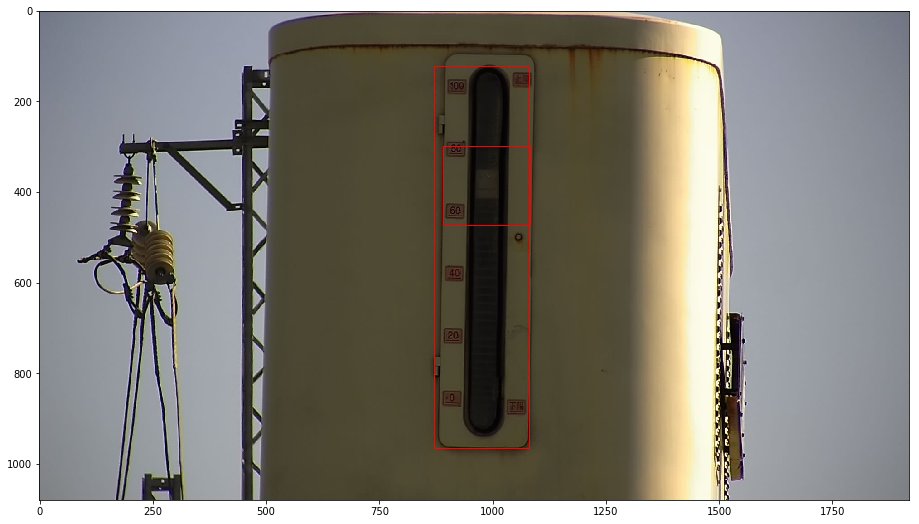

ratio: 4.0
top distance: 122.00000000000003 bottom distance: 114.0
data/20180915103340.jpg 68.72037914691943->68.61437176473933->69.28929836118483s


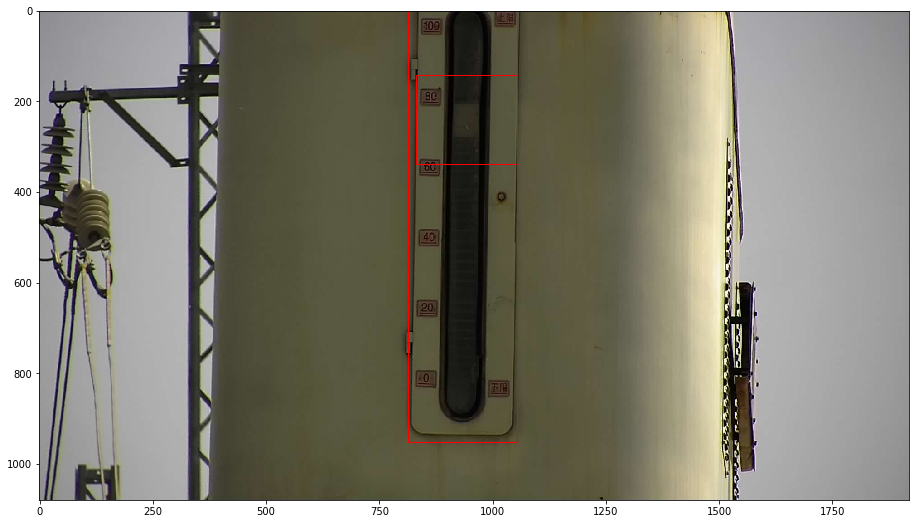

ratio: 4.0
top distance: -17.00000000000002 bottom distance: 129.0
data/20180603120404.jpg 73.50206611570248->73.8601518653719->75.19538725772728s


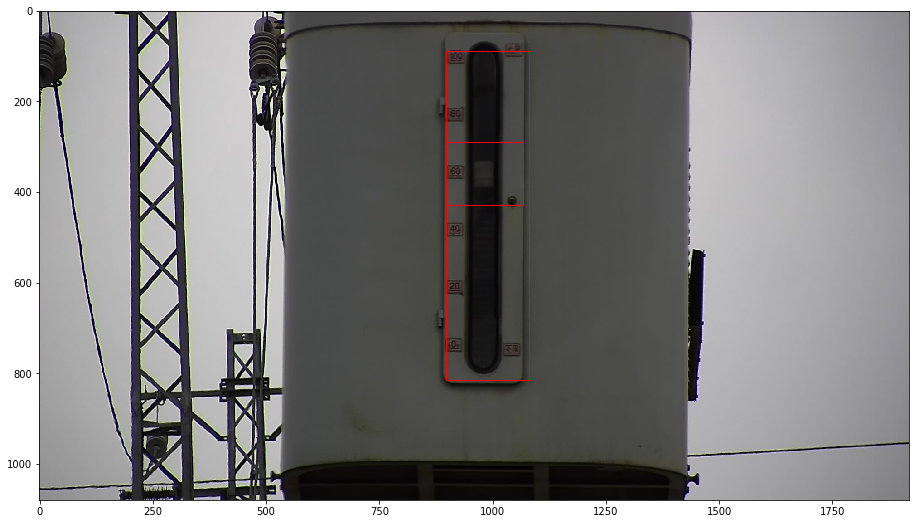

ratio: 4.0
top distance: 87.99999999999996 bottom distance: 264.0
data/20180819110347.jpg 62.77472527472527->62.091654369890115->61.945538607252736s


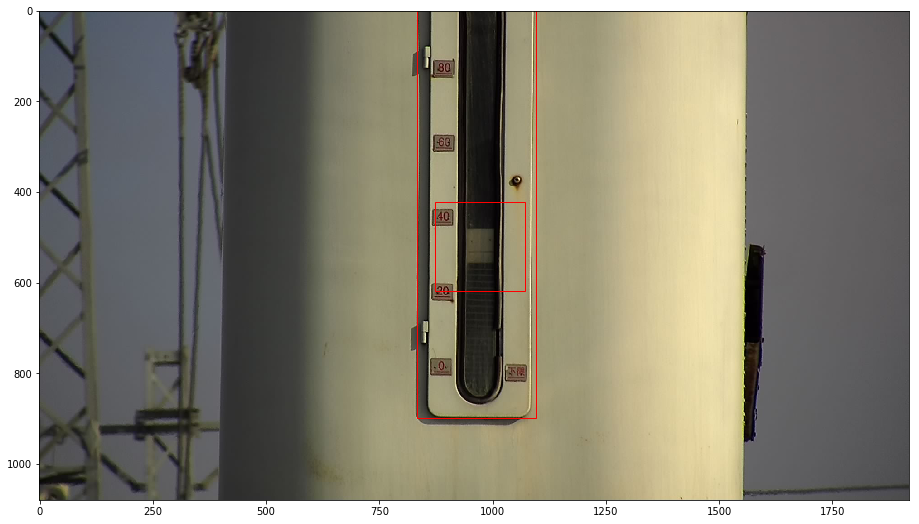

ratio: 4.0
top distance: -154.00000000000006 bottom distance: 182.0
data/20181113125957.jpg 35.88403041825095->32.59104655277567->28.73156300638783s


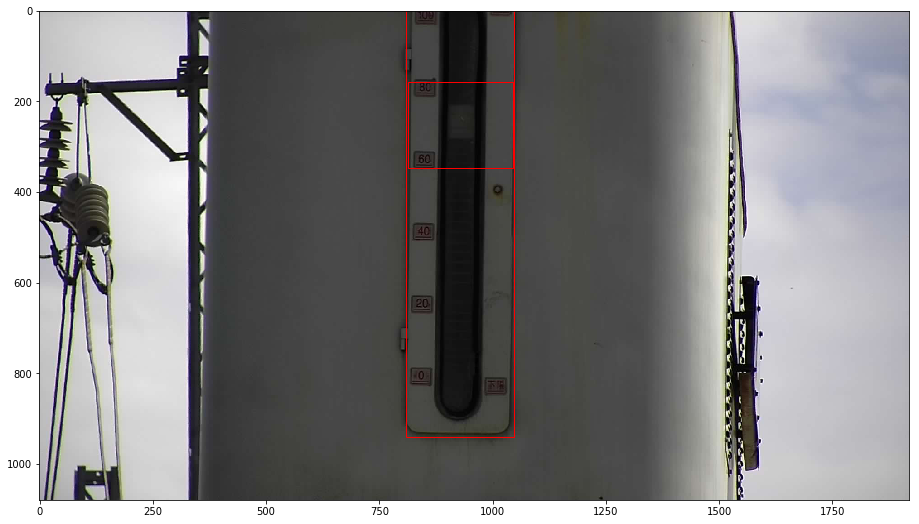

ratio: 4.000000000000001
top distance: -19.0000000000001 bottom distance: 139.0
data/20180626112603.jpg 71.71874999999999->71.90375357874998->72.99272874437499s


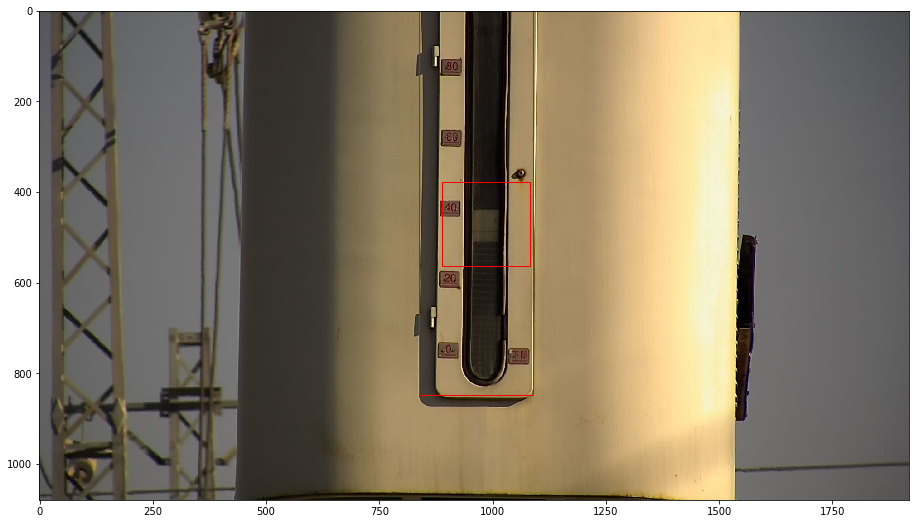

ratio: 4.0
top distance: -155.00000000000003 bottom distance: 231.0
data/20181117123001.jpg 37.699203187250994->34.58239338350598->30.973569186693226q


In [72]:
for path in paths:
    frame,classIds,confidences,boxes = preprocess(path=path)
    max_bar_idx, max_piece_idx = extract_max(classIds, confidences)
    
    plt.figure(figsize=(16,9))
    #show_detection2(frame, [boxes[max_bar_idx], boxes[max_piece_idx]])
    show_detection2(frame, [mismatch_adjust(boxes[max_bar_idx]), boxes[max_piece_idx]])
    
    img_height,img_width,_ = frame.shape
    
    bar_left,bar_top,bar_width,bar_height = mismatch_adjust(boxes[max_bar_idx])
    piece_left,piece_top,piece_width,piece_height = boxes[max_piece_idx]
    bar_right = bar_left+bar_width
    bar_bottom = bar_top + bar_height
    piece_right = piece_left + piece_width
    piece_bottom = piece_top + piece_height
    
    unadjusted = -((piece_top + piece_bottom)/2 - bar_bottom) / bar_height * 100
    print('ratio: {}'.format(bar_height / bar_width))
    print('top distance: {} bottom distance: {}'.format(bar_top, img_height - bar_bottom))
    adjusted = input('{} {}->{}->{}'.format(path, unadjusted, linear_adjust(unadjusted),
                                            linear_adjust_force(unadjusted)))
    if adjusted == 'q':
        break
    elif adjusted == '':
        adjusted = unadjusted
    elif adjusted == 's':
        continue
    '''
    with open('adjust_data','a') as f:
        f.write('{} {} {}\n'.format(path, unadjusted, adjusted))
    '''

force的校准看起来还是太强了，混合校准就差不多了。